# Final Report - I'm Something of a Painter Myself

``Final_Report.ipynb``  
Katrina Wilson & Kona Glenn   
CSCI 349 Final Project  
Link to Kaggle competition: https://www.kaggle.com/competitions/gan-getting-started/overview  

---

## Introduction  

**What problem are we working on?**  
For the final project for CSCI 249, we decided to work on a Kaggle competition. This competition describes the following challenge: use generative adversarial networks to imitate the unique style of the famout artist Claude Monet. We will bring his style to various images, doing our best to recreate his certain 'je ne sais quoi'. Can we trick viewers into beleiving we've created real Monet paintings? That is the challenge!

**What are our goals with this project?**  
*What we want to learn:* This project will be a good opportunity to use Data Mining in a context we haven't explored yet: images. Though it is easy to compare two images visually, it will be interesting to learn statistical techniques to compare the similarity of images (SSIM!).

*Expected challenges:* We expect to run into a lot of libraries and functionality that are needed in order to perform analysis on images that are unfamilliar to us. Performing meaningful EDA on images will require us to be creative. We are curious on how to best quantify our results. For now, we hope to improve the SSIM values between the original painting, a photo of the location, and the generated image. 

*Overarching goal:* We want to learn more about classifying and creating images from a neural network as well as trying to create Monet like images from landscape photos. 

In [10]:
# Get rid of pesky warnings
import warnings
warnings.filterwarnings('ignore')

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import seaborn as sns
import pandas as pd
import os
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize

# Visualization helper functions from Professor Stough
import sys
from vis_utils import *

---

## Data
### What data are we using to understand the problem?
**From Kaggle:** For training data, we have 300 Monet paintings sized 256x256 in JPEG format and the same images sized 256x256 in TFRecord format. TFRecords are used to store sequences of binary records of TensorFlow data. Our model will generate 7028 Monet-like images from 7028 photos formatted the same way as the training data. 

**Our own ideas:** After working on this project for a couple weeks, we decided to take our own spin on the project by comparing photos of the locations Monet painted with the original paintings. We then will transform the photographs into a monet-ized version, that is hopefully more similar to the original painting! We have 7 paintings and their corresponding locations. 

Here are some sample paintings and photos from the Kaggle dataset. 

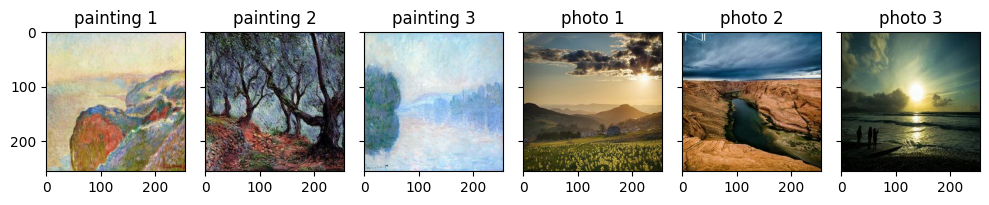

In [46]:
import matplotlib.pyplot as plt

# Load in 3 paintings 
img_0 = plt.imread('data/monet_jpg/000c1e3bff.jpg')
img_1 = plt.imread('data/monet_jpg/011835cfbf.jpg')
img_2 = plt.imread('data/monet_jpg/0260d15306.jpg')

# Load in 3 photos 
photo_0 = plt.imread('data/photo_jpg/00068bc07f.jpg')
photo_1 = plt.imread('data/photo_jpg/000910d219.jpg')
photo_2 = plt.imread('data/photo_jpg/000ded5c41.jpg')

f, ax = plt.subplots(1,6,figsize=(10,2), sharex=True, sharey=True)

ax[0].imshow(img_0);
ax[0].set_title('painting 1')
ax[1].imshow(img_1);
ax[1].set_title('painting 2')
ax[2].imshow(img_2);
ax[2].set_title('painting 3')
ax[3].imshow(photo_0);
ax[3].set_title('photo 1')
ax[4].imshow(photo_1);
ax[4].set_title('photo 2')
ax[5].imshow(photo_2);
ax[5].set_title('photo 3')

plt.tight_layout()
plt.show()

Here are the paintings and photos of locations Monet painted.


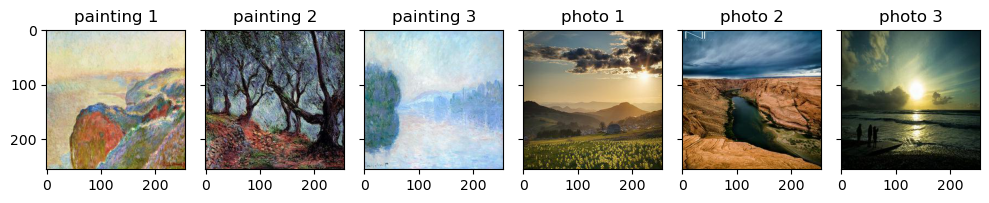

In [ ]:
# Load in 3 paintings 
img_0 = plt.imread('data/monet_jpg/000c1e3bff.jpg')
img_1 = plt.imread('data/monet_jpg/011835cfbf.jpg')
img_2 = plt.imread('data/monet_jpg/0260d15306.jpg')

# Load in 3 photos 
photo_0 = plt.imread('data/photo_jpg/00068bc07f.jpg')
photo_1 = plt.imread('data/photo_jpg/000910d219.jpg')
photo_2 = plt.imread('data/photo_jpg/000ded5c41.jpg')

f, ax = plt.subplots(1,6,figsize=(10,2), sharex=True, sharey=True)

ax[0].imshow(img_0);
ax[0].set_title('painting 1')
ax[1].imshow(img_1);
ax[1].set_title('painting 2')
ax[2].imshow(img_2);
ax[2].set_title('painting 3')
ax[3].imshow(photo_0);
ax[3].set_title('photo 1')
ax[4].imshow(photo_1);
ax[4].set_title('photo 2')
ax[5].imshow(photo_2);
ax[5].set_title('photo 3')

plt.tight_layout()
plt.show()

Here are the paintings and photos of locations Monet painted.

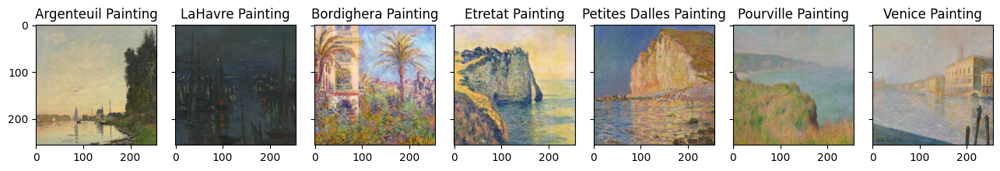

In [11]:
# Load in 7 paintings 
painting_arg = plt.imread('data/monet_loc.jpg/Argenteuil.jpg')
painting_lah = plt.imread('data/monet_loc.jpg/LaHavre.jpg')
painting_bor = plt.imread('data/monet_loc.jpg/painting-bordighera.jpg')
painting_etr = plt.imread('data/monet_loc.jpg/painting-etretat.jpg')
painting_dal = plt.imread('data/monet_loc.jpg/Petites-Dalles.jpg')
painting_pou = plt.imread('data/monet_loc.jpg/Pourville.jpg')
painting_ven = plt.imread('data/monet_loc.jpg/Venice.jpg')

f, ax = plt.subplots(1,7,figsize=(13,2), sharex=True, sharey=True)

ax[0].imshow(painting_arg);
ax[0].set_title('Argenteuil Painting')
ax[1].imshow(painting_lah);
ax[1].set_title('LaHavre Painting')
ax[2].imshow(painting_bor);
ax[2].set_title('Bordighera Painting')
ax[3].imshow(painting_etr);
ax[3].set_title('Etretat Painting')
ax[4].imshow(painting_dal);
ax[4].set_title('Petites Dalles Painting')
ax[5].imshow(painting_pou);
ax[5].set_title('Pourville Painting')
ax[6].imshow(painting_ven)
ax[6].set_title('Venice Painting')


plt.tight_layout()
plt.show()

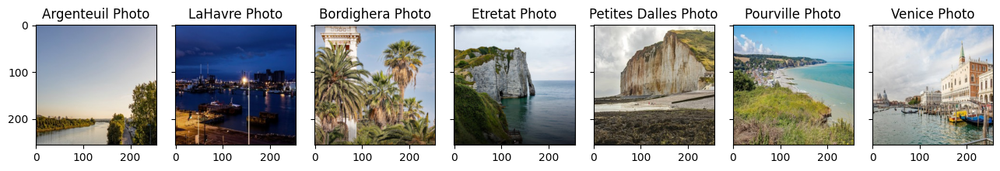

In [12]:
# Load in 7 locations
loc_arg = plt.imread('data/monet_ref_loc.jpg/Argenteuil.jpg')
loc_lah = plt.imread('data/monet_ref_loc.jpg/LaHavre.jpg')
loc_bor = plt.imread('data/monet_ref_loc.jpg/photo-bordighera.jpg')
loc_etr = plt.imread('data/monet_ref_loc.jpg/photo-etretat.jpg')
loc_dal = plt.imread('data/monet_ref_loc.jpg/Petites-Dalles.jpg')
loc_pou = plt.imread('data/monet_ref_loc.jpg/Pourville.jpg')
loc_ven = plt.imread('data/monet_ref_loc.jpg/Venice.jpg')

f, ax = plt.subplots(1,7,figsize=(13,2), sharex=True, sharey=True)

ax[0].imshow(loc_arg);
ax[0].set_title('Argenteuil Photo')
ax[1].imshow(loc_lah);
ax[1].set_title('LaHavre Photo')
ax[2].imshow(loc_bor);
ax[2].set_title('Bordighera Photo')
ax[3].imshow(loc_etr);
ax[3].set_title('Etretat Photo')
ax[4].imshow(loc_dal);
ax[4].set_title('Petites Dalles Photo')
ax[5].imshow(loc_pou);
ax[5].set_title('Pourville Photo')
ax[6].imshow(loc_ven)
ax[6].set_title('Venice Photo')

plt.tight_layout()
plt.show()

---

## Data Preparation  
**How are we preprocessing our data?**  
Since we are using images, data munging/cleaning looks a little different than how it has been in the previous labs. The images are already standardized to a 256x256 JPEG format, as is given by the Kaggle data set. To be extra thorough, we visually inspected all of the photos of paintings before running our model, to make sure there weren't any misformatted paintings. In tradititional data mining, it would be impossible to manually inspect all data entries but for images, we thought a quick once over would do no harm. Low and behold, we found 3 images that were questionable. 

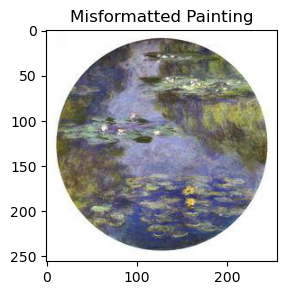

In [ ]:
# Show the painting 
bad_painting_1 = plt.imread('data/bad-painting/c78b4fa3a9.jpg')

plt.figure(figsize=(4,3))
plt.imshow(bad_painting_1); # semicolon ; to suppress text display
plt.title("Misformatted Painting")
plt.show()

We decided to eliminate this image from the dataset, given that the white borders are not a part of the paintin and may skew the future models. 

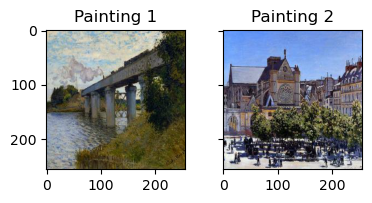

In [ ]:
f, ax = plt.subplots(1,2,figsize=(4,2), sharex=True, sharey=True)

bad_painting_2 = plt.imread('data/monet_jpg/1a127acf4d.jpg')
bad_painting_3 = plt.imread('data/monet_jpg/815624563e.jpg')

ax[0].imshow(bad_painting_2);
ax[0].set_title('Painting 1')
ax[1].imshow(bad_painting_3);
ax[1].set_title('Painting 2')
plt.tight_layout()
plt.show()

For these images, we first thought they looked too much like real photos to be Monet paintings. But, upon further inspection and reverse image searchs on google, they were indeed Monet paintings. The low resolution of the photos of paintings definitely altered the quality, but we're glad that we double checked. All of the other photos of paintings seemed appropriate.

---

# EDA - Exploratory Data Analysis  


### RGB Pixel Distribution

To start, we thought it would be valuable to understand the differences in the distributions of pixels in both of our datasets: the paintings and the photos to be transformed.

In [ ]:
'''
Function that averages the red, green, and blue values of 
pixels of every image in a folder.

'''
def extract_rgb_means(folder_path):

    # Initialize lists to store statistics
    red_means = []
    green_means = []
    blue_means = []

    red_medians = []
    green_medians = []
    blue_medians = []

    red_std = []
    green_std = []
    blue_std = []

    # Iterate through all image files in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg"):
            # Construct the full path to the image
            image_path = os.path.join(folder_path, filename)
            
            # Load the image
            image = cv2.imread(image_path)
            
            if image is not None:
                # Convert BGR to RGB
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                
                # Extract individual color channels
                red_channel = image_rgb[:, :, 0]
                green_channel = image_rgb[:, :, 1]
                blue_channel = image_rgb[:, :, 2]
                
                # Calculate mean for each color channel
                r_mean = np.mean(red_channel)
                g_mean = np.mean(green_channel)
                b_mean = np.mean(blue_channel)

                # Calculate median for each color channel
                r_median = np.median(red_channel)
                g_median = np.median(green_channel)
                b_median = np.median(blue_channel)

                # Calculate the standard deviation for each color channel
                r_std = np.std(red_channel)
                g_std = np.std(green_channel)
                b_std = np.std(blue_channel)

                red_means.append(r_mean)
                green_means.append(g_mean)
                blue_means.append(b_mean)

                red_medians.append(r_median)
                green_medians.append(g_median)
                blue_medians.append(b_median)

                red_std.append(r_std)
                green_std.append(g_std)
                blue_std.append(b_std)


    # Create DataFrames for each color
    df_red = pd.DataFrame({"color": "red", "mean": red_means, "median": red_medians, "standard_deviation": red_std})
    df_green = pd.DataFrame({"color": "green", "mean": green_means, "median": green_medians, "standard_deviation": green_std})
    df_blue = pd.DataFrame({"color": "blue", "mean": blue_means, "median": blue_medians, "standard_deviation": blue_std})

    # Concatenate DataFrames
    df_means = pd.concat([df_red, df_green, df_blue], ignore_index=True)

    return df_means


Now, we visualize the distribution of pixels for the Monet JPG images and the landscape photos using a boxplot. Boxplots are a great way to visualize the distribution of a single variable. 

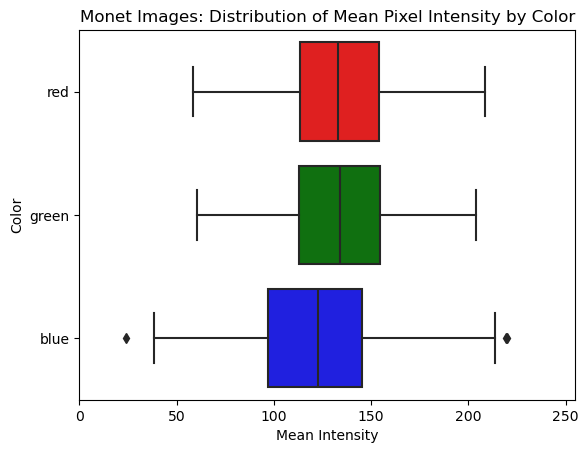

In [ ]:
# Create visualization for Monet images
df_monet = extract_rgb_means('data/monet_jpg/')

# Plot boxplot
colors = {'red': 'red', 'green': 'green', 'blue': 'blue'}

sns.boxplot(data=df_monet, x="mean", y="color", palette=colors)
plt.title('Monet Images: Distribution of Mean Pixel Intensity by Color')
plt.xlabel('Mean Intensity')
plt.ylabel('Color')
plt.xlim(0, 255)
plt.show()

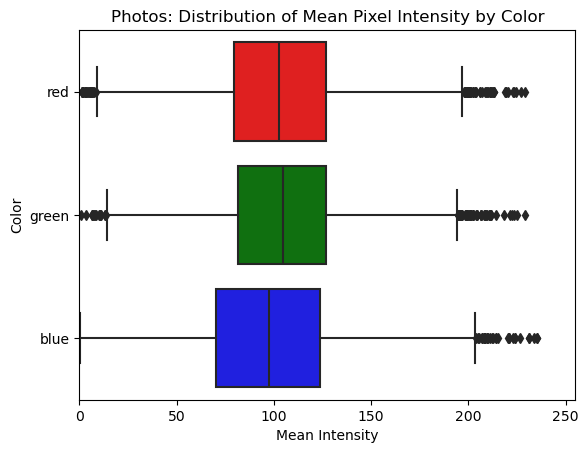

In [ ]:
# Create visualization for Monet images
df_photo = extract_rgb_means('data/photo_jpg/')

# Plot boxplot
colors = {'red': 'red', 'green': 'green', 'blue': 'blue'}

sns.boxplot(data=df_photo, x="mean", y="color", palette=colors)
plt.title('Photos: Distribution of Mean Pixel Intensity by Color')
plt.xlabel('Mean Intensity')
plt.ylabel('Color')
plt.xlim(0, 255)
plt.show()

**Understanding the boxplots**  
Based on the boxplots, there are a lot more outliers in the photos dataset compared to the paintings dataset. The median RBG values for photos are typically 20ish pixels lower than the RBG values for the paintings. But, there is a significant amount of overlap between the boxes created by the Q1 and Q3 values for each color when comparing the photos to the paintings. This means that there isn't a huge significant difference between the RGB values of both datasets, but Monet paintings tend to have higher RGB values, which visually means lighter or more "pastel" colors. Monet paintings tend to have less shadows than real images, which perhaps also contributes to the higher distribution of RGB values for the paintings.

We can also show plots of the RGB values for Monet paintings and photos using histograms.

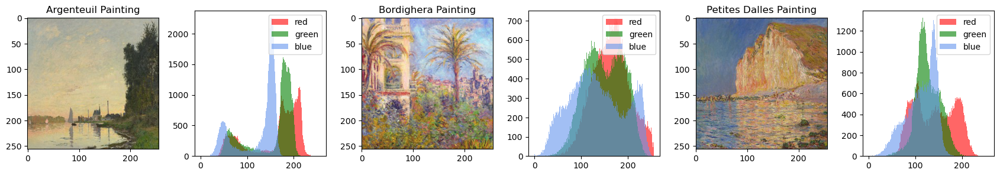

In [ ]:
f, axarr = plt.subplots(1,6, figsize=(17, 3))

# https://matplotlib.org/api/_as_gen/matplotlib.pyplot.imshow.html
axarr[0].imshow(painting_arg) 
axarr[0].set_title('Argenteuil Painting')

axarr[1].hist(painting_arg[...,0].ravel(), bins=np.arange(257), alpha = .6, label = 'red', color = 'r');
axarr[1].hist(painting_arg[...,1].ravel(), bins=np.arange(257), alpha = .6, label = 'green', color = 'g');
axarr[1].hist(painting_arg[...,2].ravel(), bins=np.arange(257), alpha = .6, label = 'blue', color = 'cornflowerblue');
axarr[1].legend(loc = 'upper right');

axarr[2].imshow(painting_bor) 
axarr[2].set_title('Bordighera Painting')

axarr[3].hist(painting_bor[...,0].ravel(), bins=np.arange(257), alpha = .6, label = 'red', color = 'r');
axarr[3].hist(painting_bor[...,1].ravel(), bins=np.arange(257), alpha = .6, label = 'green', color = 'g');
axarr[3].hist(painting_bor[...,2].ravel(), bins=np.arange(257), alpha = .6, label = 'blue', color = 'cornflowerblue');
axarr[3].legend(loc = 'upper right');

axarr[4].imshow(painting_dal) 
axarr[4].set_title('Petites Dalles Painting')

axarr[5].hist(painting_dal[...,0].ravel(), bins=np.arange(257), alpha = .6, label = 'red', color = 'r');
axarr[5].hist(painting_dal[...,1].ravel(), bins=np.arange(257), alpha = .6, label = 'green', color = 'g');
axarr[5].hist(painting_dal[...,2].ravel(), bins=np.arange(257), alpha = .6, label = 'blue', color = 'cornflowerblue');
axarr[5].legend(loc = 'upper right');

plt.tight_layout()
plt.show()

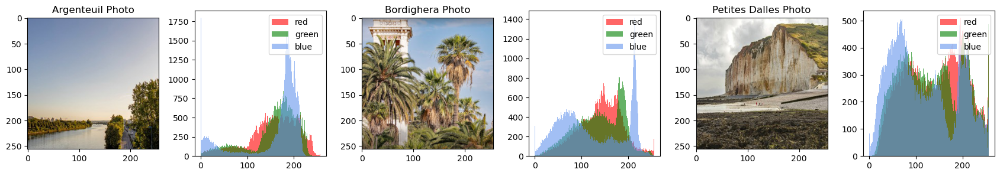

In [ ]:
f, axarr = plt.subplots(1,6, figsize=(17, 3))

# https://matplotlib.org/api/_as_gen/matplotlib.pyplot.imshow.html
axarr[0].imshow(loc_arg) 
axarr[0].set_title('Argenteuil Photo')

axarr[1].hist(loc_arg[...,0].ravel(), bins=np.arange(257), alpha = .6, label = 'red', color = 'r');
axarr[1].hist(loc_arg[...,1].ravel(), bins=np.arange(257), alpha = .6, label = 'green', color = 'g');
axarr[1].hist(loc_arg[...,2].ravel(), bins=np.arange(257), alpha = .6, label = 'blue', color = 'cornflowerblue');
axarr[1].legend(loc = 'upper right');

axarr[2].imshow(loc_bor) 
axarr[2].set_title('Bordighera Photo')

axarr[3].hist(loc_bor[...,0].ravel(), bins=np.arange(257), alpha = .6, label = 'red', color = 'r');
axarr[3].hist(loc_bor[...,1].ravel(), bins=np.arange(257), alpha = .6, label = 'green', color = 'g');
axarr[3].hist(loc_bor[...,2].ravel(), bins=np.arange(257), alpha = .6, label = 'blue', color = 'cornflowerblue');
axarr[3].legend(loc = 'upper right');

axarr[4].imshow(loc_dal) 
axarr[4].set_title('Petites Dalles Photo')

axarr[5].hist(loc_dal[...,0].ravel(), bins=np.arange(257), alpha = .6, label = 'red', color = 'r');
axarr[5].hist(loc_dal[...,1].ravel(), bins=np.arange(257), alpha = .6, label = 'green', color = 'g');
axarr[5].hist(loc_dal[...,2].ravel(), bins=np.arange(257), alpha = .6, label = 'blue', color = 'cornflowerblue');
axarr[5].legend(loc = 'upper right');

plt.tight_layout()
plt.show()

**Understanding the RGB historgrams**  
Though there are only 3 of the paintings and 3 of the photos, we can notice that the pixels are on average lighter for the Petites Dalles painting than the photo, which is unsurprising given the mass of seaweed at the bottom of the photo. These histograms aren't super helpful, but interesting to see that we can quantify the distribution of red, green, and blue from an image.

### Summary Statistcs  
We calculated the means, medians, and standard deviations for both image datasets.

In [ ]:
# Create data frames for different color channels
# Paintings
df_r_monet = df_monet[df_monet["color"] == "red"]
df_g_monet = df_monet[df_monet["color"] == "green"]
df_b_monet = df_monet[df_monet["color"] == "blue"]

# Photos
df_r_photo = df_photo[df_photo["color"] == "red"]
df_g_photo = df_photo[df_photo["color"] == "green"]
df_b_photo = df_photo[df_photo["color"] == "blue"]

In [ ]:
# Means for Monet Paintings
mean_r = df_r_monet["mean"].mean()
mean_g = df_g_monet["mean"].mean()
mean_b = df_b_monet["mean"].mean()

print(f"The mean pixel value of red in Monet paintings: {mean_r:.2f}")
print(f"The mean pixel value of green in Monet paintings: {mean_g:.2f}")
print(f"The mean pixel value of blue in Monet paintings: {mean_b:.2f}")


The mean pixel value of red in Monet paintings: 132.87
The mean pixel value of green in Monet paintings: 133.63
The mean pixel value of blue in Monet paintings: 121.43


In [ ]:
# Means for photos
mean_r = df_r_photo["mean"].mean()
mean_g = df_g_photo["mean"].mean()
mean_b = df_b_photo["mean"].mean()

print(f"The mean pixel value of red in photos: {mean_r:.2f}")
print(f"The mean pixel value of green in photos: {mean_g:.2f}")
print(f"The mean pixel value of blue in photots: {mean_b:.2f}")

The mean pixel value of red in photos: 102.97
The mean pixel value of green in photos: 104.19
The mean pixel value of blue in photots: 97.93


In [ ]:
# Medians for Monet Paintings
median_r = df_r_monet["median"].mean()
median_g = df_g_monet["median"].mean()
median_b = df_b_monet["median"].mean()

print(f"The median pixel value of red in Monet paintings: {median_r:.2f}")
print(f"The median pixel value of green in Monet paintings: {median_g:.2f}")
print(f"The median pixel value of blue in Monet paintings: {median_b:.2f}")

The median pixel value of red in Monet paintings: 135.30
The median pixel value of green in Monet paintings: 135.98
The median pixel value of blue in Monet paintings: 121.55


In [ ]:
# Medians for photos
median_r = df_r_photo["median"].mean()
median_g = df_g_photo["median"].mean()
median_b = df_b_photo["median"].mean()

print(f"The median pixel value of red in photos: {median_r:.2f}")
print(f"The median pixel value of green in photos: {median_g:.2f}")
print(f"The median pixel value of blue in photots: {median_b:.2f}")

The median pixel value of red in photos: 97.78
The median pixel value of green in photos: 101.46
The median pixel value of blue in photots: 95.24


In [ ]:
# Standard deviations for Monet
std_r = df_r_monet["standard_deviation"].mean()
std_g = df_g_monet["standard_deviation"].mean()
std_b = df_b_monet["standard_deviation"].mean()

print(f"The standard deviation of pixel value of red in Monet paintings: {std_r:.2f}")
print(f"The standard deviation of pixel value of green in Monet paintings: {std_g:.2f}")
print(f"The standard deviation of pixel value of blue in Monet paintings: {std_b:.2f}")

The standard deviation of pixel value of red in Monet paintings: 48.67
The standard deviation of pixel value of green in Monet paintings: 46.37
The standard deviation of pixel value of blue in Monet paintings: 49.45


In [ ]:
# Standard deviations for photos
std_r = df_r_photo["standard_deviation"].mean()
std_g = df_g_photo["standard_deviation"].mean()
std_b = df_b_photo["standard_deviation"].mean()

print(f"The standard deviation of pixel value of red in photos: {std_r:.2f}")
print(f"The standard deviation of pixel value of green in photos: {std_g:.2f}")
print(f"The standard deviation of pixel value of blue in photots: {std_b:.2f}")

The standard deviation of pixel value of red in photos: 56.58
The standard deviation of pixel value of green in photos: 51.70
The standard deviation of pixel value of blue in photots: 56.04


**Understanding the summary statistics**  
*Means*:  For all three color channels, the Monet Paintings have on average a higher mean pixel value (by about 30), implying lighter colors than the photos, as was shown in the boxplots.   
*Medians*: Similar to the means, the Monet Paintings have a higher medain pixel value.  
*Standard Deviation*: There are smaller standard deviations for the RGB channels for the Monet Paintings compared to the photos. This implies that there is less variability in color for the Monet Paintings than for the photos. This is interesting! Monet's impressionist style emphasizes light over the specific colors of the real-life scene he is depicting, leading to hues with less variations. Photos, on the other hand, captures a lot more detail in color than a painting.  

## K-means Clustering  
Here we do k-means clustering on an image to get representative colors for the image. We will compare Monet Paintings to photos of the locations Monet painted using image reconstruction. 

*From Professor Stough's ``demo_kmeans_image.ipynb`` in https://github.com/joshuastough/imageprocessing*

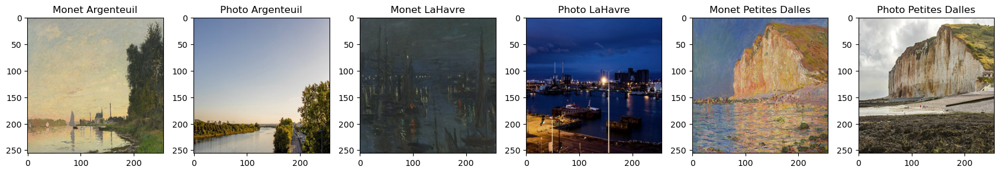

In [ ]:
# Load in photos and paintings
painting_arg = plt.imread('data/monet_loc.jpg/Argenteuil.jpg')
photo_arg = plt.imread('data/monet_ref_loc.jpg/Argenteuil.jpg')

painting_lahav = plt.imread('data/monet_loc.jpg/LaHavre.jpg')
photo_lahav = plt.imread('data/monet_ref_loc.jpg/LaHavre.jpg')

painting_petite = plt.imread('data/monet_loc.jpg/Petites-Dalles.jpg')
photo_petite = plt.imread('data/monet_ref_loc.jpg/Petites-Dalles.jpg')

# Show the paintings and the photos 
f, axarr = plt.subplots(1,6, figsize=(17, 3))

axarr[0].imshow(painting_arg) 
axarr[0].set_title('Monet Argenteuil')

axarr[1].imshow(photo_arg) 
axarr[1].set_title('Photo Argenteuil')

axarr[2].imshow(painting_lahav) 
axarr[2].set_title('Monet LaHavre')

axarr[3].imshow(photo_lahav) 
axarr[3].set_title('Photo LaHavre')

axarr[4].imshow(painting_petite)
axarr[4].set_title('Monet Petites Dalles')

axarr[5].imshow(photo_petite) 
axarr[5].set_title('Photo Petites Dalles')

plt.tight_layout()
plt.show()

In [ ]:
# Our functions to generate k means for images
K = 16
MAXITER = 20
NUMPOINTS = 100

# For fun: Let's pick some random (and good) cluster colors
clusterColors = np.random.rand(K, 3) # Picking random colors for each cluster.
varsSoFar = np.var(clusterColors, axis=0) # Should be 1 x 2 of the variance of each column.

for i in range(3*K):
    tempColors = np.random.rand(K, 3) #Picking K random colors
    vartemp = np.var(tempColors, axis=0)
    if np.all(vartemp > varsSoFar):
        clusterColors = tempColors
        varsSoFar = vartemp

# clusterColors

def color_kmeans(image, K):
    # K-means: initialization
    # pick K initial cluster centers.
    # whichinit = random.randint(0, len(X), size=(K,)) # Could generate repeats.
    X_image = np.stack([image[...,i].ravel() for i in range(3)]).T

    whichinit = np.random.choice(len(X_image), size=K, replace=False)
    CC = X_image[whichinit, :].copy() # Cluster Centers

    CC_init = CC.copy()

    ''' Main Expectation-Maximization loop
    Assign a cluster to each point, then recompute the clusters based on that assignment
    K-means: compute: for every data point determine which center is closest.
    Need some magic function that computes the distance between every row of X
    (the points) and every row of CC (the clusters).
    Basically, we assign a cluster to each point, and then
    recompute the clusters based on that assignment.'''
    
    for i in range(MAXITER):
        D = cdist(X_image, CC, 'euclidean')
        # D should be NUMPOINTS x K

        whichCluster = np.argmin(D, axis=1) # NUMPOINTS x 1 of which center was closest

        # K-means: recompute the cluster centers as the mean of the data in each cluster
        for c in range(K):
            if np.any(whichCluster == c):
                CC[c,:] = np.mean(X_image[whichCluster == c, :], axis=0) # average of just those that were closest to c.
    return X_image, CC, CC_init, whichCluster



Let's visualize the clustering for the Argenteuil photo and painting. 

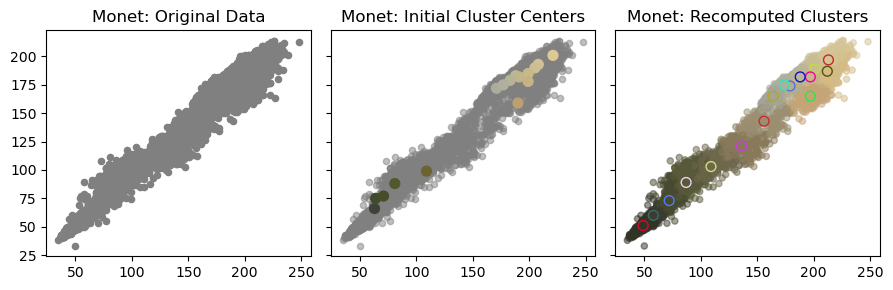

In [ ]:
# Doing this on a big image, don't want to scatter 100Ks of points, really slow.
X_agr_monet, CC_agr_monet, CC_init_agr_monet, whichCluster_agr_monet = color_kmeans(painting_arg, 16)

rands = np.sort(np.random.choice(len(X_agr_monet), size=500*K, replace=False))

f, ax = plt.subplots(1,3, figsize=(9,3), sharex=True, sharey=True)
ax[0].scatter(X_agr_monet[rands,0], X_agr_monet[rands,1], c='gray', s=20)
ax[0].set_title('Monet: Original Data')


ax[1].scatter(X_agr_monet[rands,0], X_agr_monet[rands,1], c='gray', alpha=.5, s=20)
ax[1].scatter(CC_init_agr_monet[:,0], CC_init_agr_monet[:,1], c=CC_init_agr_monet/255, s=50)
ax[1].set_title('Monet: Initial Cluster Centers')


pointColors = CC_agr_monet[whichCluster_agr_monet[rands], :]
clusterEdgeColors = 1 - clusterColors # for contrast, make the cluster center edges opposite.
# clusterEdgeColors = 1 - CC/255 # for contrast, make the cluster center edges opposite.

ax[2].scatter(X_agr_monet[rands,0], X_agr_monet[rands,1], c=pointColors/255, alpha=.5, s=20)
ax[2].scatter(CC_agr_monet[:,0], CC_agr_monet[:,1], c=CC_agr_monet/255, edgecolors=clusterEdgeColors, s=50)
ax[2].set_title('Monet: Recomputed Clusters')

plt.tight_layout()
plt.show()

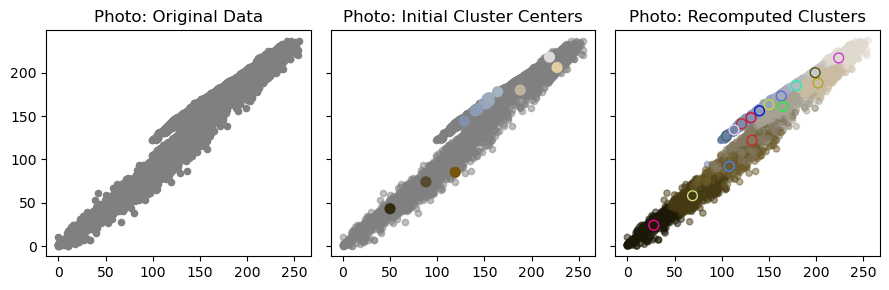

In [ ]:
# Repeat with the photograph
X_agr_photo, CC_agr_photo, CC_init_agr_photo, whichCluster_agr_photo = color_kmeans(photo_arg, K)

rands = np.sort(np.random.choice(len(X_agr_photo), size=500*K, replace=False))

f, ax = plt.subplots(1,3, figsize=(9,3), sharex=True, sharey=True)
ax[0].scatter(X_agr_photo[rands,0], X_agr_photo[rands,1], c='gray', s=20)
ax[0].set_title('Photo: Original Data')


ax[1].scatter(X_agr_photo[rands,0], X_agr_photo[rands,1], c='gray', alpha=.5, s=20)
ax[1].scatter(CC_init_agr_photo[:,0], CC_init_agr_photo[:,1], c=CC_init_agr_photo/255, s=50)
ax[1].set_title('Photo: Initial Cluster Centers')


pointColors = CC_agr_photo[whichCluster_agr_photo[rands], :]
clusterEdgeColors = 1 - clusterColors # for contrast, make the cluster center edges opposite.
# clusterEdgeColors = 1 - CC/255 # for contrast, make the cluster center edges opposite.

ax[2].scatter(X_agr_photo[rands,0], X_agr_photo[rands,1], c=pointColors/255, alpha=.5, s=20)
ax[2].scatter(CC_agr_photo[:,0], CC_agr_photo[:,1], c=CC_agr_photo/255, edgecolors=clusterEdgeColors, s=50)
ax[2].set_title('Photo: Recomputed Clusters')

plt.tight_layout()
plt.show()

**Understanding the clustering**  
For the photo, we notice a lot of clusters closer together in the blue and white hues. The clusters are more evenly distributed in the painting. Monet's brushstrokes depict a less smooth vison of a sunset, perhaps leading to a more even distribution of hues in the clustering.

Now, let's reconstruct the paintings and photos using clustering. We will also visualize the clustering using a 2D image, now plotting 100 color values that were randomly chosen.

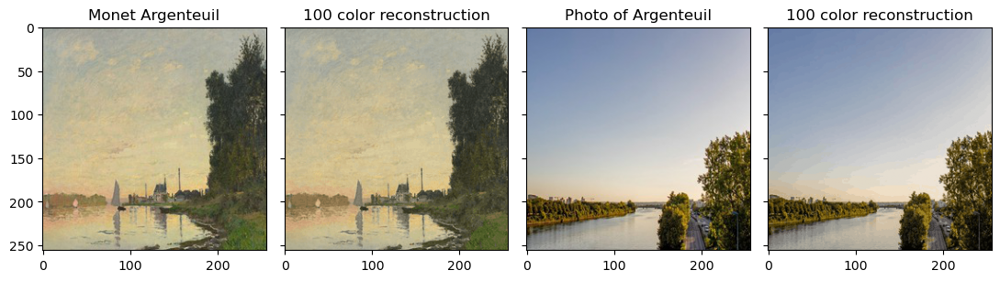

In [ ]:
X_agr_monet_100, CC_agr_monet_100, CC_init_agr_monet_100, whichCluster_agr_monet_100 = color_kmeans(painting_arg, 100)
X_agr_photo_100, CC_agr_photo_100, CC_init_agr_photo_100, whichCluster_agr_photo_100 = color_kmeans(photo_arg, 100)

f, ax = plt.subplots(1,4, figsize=(11,3), sharex=True, sharey=True)

ax[0].imshow(painting_arg/255)
ax[0].set_title('Monet Argenteuil')

# Reconstructed Image.
Ir_arg_monet_100 = np.reshape(CC_agr_monet_100[whichCluster_agr_monet_100,:], painting_arg.shape)
ax[1].imshow(Ir_arg_monet_100/255) # Because it's floating point.
ax[1].set_title('{} color reconstruction'.format(K))

ax[2].imshow(photo_arg/255)
ax[2].set_title('Photo of Argenteuil')

# Reconstructed Image.
Ir_arg_photo_100 = np.reshape(CC_agr_photo_100[whichCluster_agr_photo_100,:], photo_arg.shape)
ax[3].imshow(Ir_arg_photo_100/255) # Because it's floating point.
ax[3].set_title('{} color reconstruction'.format(K))

plt.tight_layout()
plt.show()

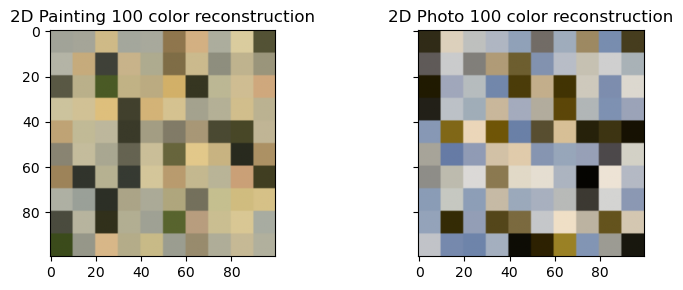

In [ ]:
def transform_image(image, CC):
    for i in range(10):
        for j in range(10):

            image[i*10:i*10 + 10, j*10:j*10 + 10, :] = np.array(CC[10*i + j])
    return image

f, ax = plt.subplots(1,2, figsize=(8,3), sharex=True, sharey=True)

arg_painting_100 = np.zeros((100, 100, 3))
arg_photo_100 = np.zeros((100, 100, 3))

arg_painting_100 = transform_image(arg_painting_100, CC_agr_monet_100)
arg_photo_100 = transform_image(arg_photo_100, CC_agr_photo_100)

ax[0].imshow(arg_painting_100/255)
ax[0].set_title('2D Painting {} color reconstruction'.format(K))

ax[1].imshow(arg_photo_100/255)
ax[1].set_title('2D Photo {} color reconstruction'.format(K))

# plt.figure()
# plt.imshow(test_img/255)
plt.tight_layout()
plt.show()

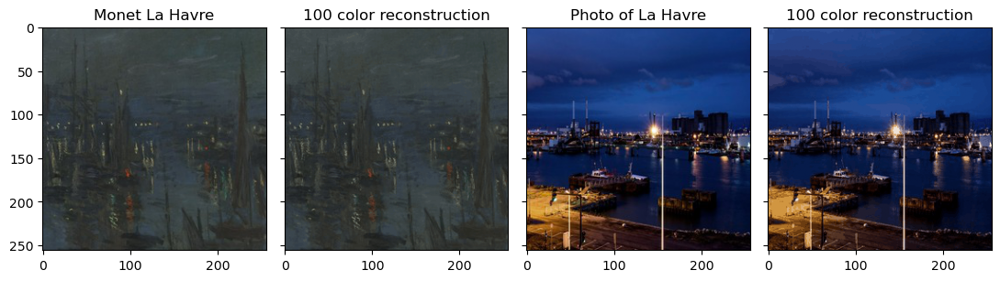

In [ ]:
K = 100
X_lahav_photo, CC_lahav_photo, CC_init_lahav_photo, whichCluster_lahav_photo = color_kmeans(photo_lahav, K=100)
X_lahav_painting, CC_lahav_painting, CC_init_lahav_painting, whichCluster_lahav_painting = color_kmeans(painting_lahav, K=100)

f, ax = plt.subplots(1,4, figsize=(11,3), sharex=True, sharey=True)

ax[0].imshow(painting_lahav/255)
ax[0].set_title('Monet La Havre')

# Reconstructed Image.
Ir_lahav_monet = np.reshape(CC_lahav_painting[whichCluster_lahav_painting,:], painting_lahav.shape)
ax[1].imshow(Ir_lahav_monet/255) # Because it's floating point.
ax[1].set_title('{} color reconstruction'.format(K))

ax[2].imshow(photo_lahav/255)
ax[2].set_title('Photo of La Havre')

# Reconstructed Image.
Ir_lahav_photo = np.reshape(CC_lahav_photo[whichCluster_lahav_photo,:], photo_lahav.shape)
ax[3].imshow(Ir_lahav_photo/255) # Because it's floating point.
ax[3].set_title('{} color reconstruction'.format(K))

plt.tight_layout()
plt.show()

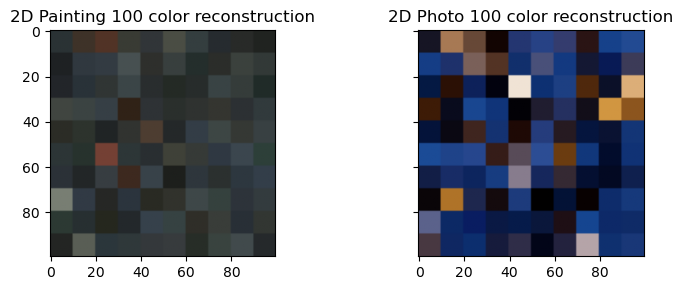

In [ ]:
f, ax = plt.subplots(1,2, figsize=(8,3), sharex=True, sharey=True)

havre_painting_100 = np.zeros((100, 100, 3))
havre_photo_100 = np.zeros((100, 100, 3))

havre_painting_100 = transform_image(havre_painting_100, CC_lahav_painting)
havre_photo_100 = transform_image(havre_photo_100, CC_lahav_photo)

ax[0].imshow(havre_painting_100/255)
ax[0].set_title('2D Painting {} color reconstruction'.format(K))

ax[1].imshow(havre_photo_100/255)
ax[1].set_title('2D Photo {} color reconstruction'.format(K))

# plt.figure()
# plt.imshow(test_img/255)
plt.tight_layout()
plt.show()

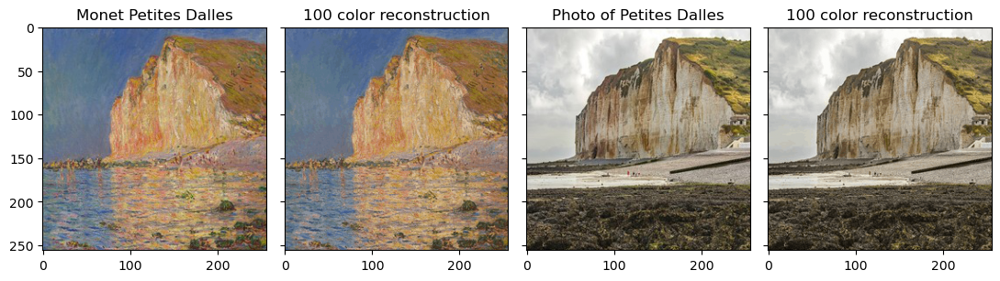

In [ ]:
X_petite_painting, CC_petite_painting, CC_init_petite_painting, whichCluster_petite_painting = color_kmeans(painting_petite, K=100)
X_petite_photo, CC_petite_photo, CC_init_petite_photo, whichCluster_petite_photo = color_kmeans(photo_petite, K=100)

f, ax = plt.subplots(1,4, figsize=(11,3), sharex=True, sharey=True)

ax[0].imshow(painting_petite/255)
ax[0].set_title('Monet Petites Dalles')

# Reconstructed Image.
Ir_petite_monet = np.reshape(CC_petite_painting[whichCluster_petite_painting,:], painting_petite.shape)
ax[1].imshow(Ir_petite_monet/255) # Because it's floating point.
ax[1].set_title('{} color reconstruction'.format(K))

ax[2].imshow(photo_petite/255)
ax[2].set_title('Photo of Petites Dalles')

# Reconstructed Image.
Ir_petite_photo = np.reshape(CC_petite_photo[whichCluster_petite_photo,:], photo_petite.shape)
ax[3].imshow(Ir_petite_photo/255) # Because it's floating point.
ax[3].set_title('{} color reconstruction'.format(K))

plt.tight_layout()
plt.show()

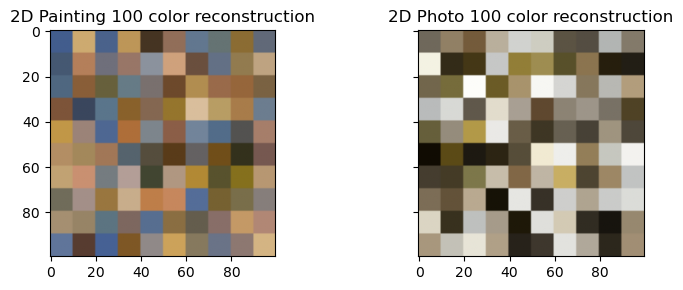

In [ ]:
f, ax = plt.subplots(1,2, figsize=(8,3), sharex=True, sharey=True)

petite_painting_100 = np.zeros((100, 100, 3))
petite_photo_100 = np.zeros((100, 100, 3))

petite_painting_100 = transform_image(petite_painting_100, CC_petite_painting)
petite_photo_100 = transform_image(petite_photo_100, CC_petite_photo)

ax[0].imshow(petite_painting_100/255)
ax[0].set_title('2D Painting {} color reconstruction'.format(K))

ax[1].imshow(petite_photo_100/255)
ax[1].set_title('2D Photo {} color reconstruction'.format(K))

# plt.figure()
# plt.imshow(test_img/255)
plt.tight_layout()
plt.show()

**Understanding the 2D Reconstructions**  
We are picking 100 colors from the original painting and the original photo are making new 100x100 images with just those colors. We think that these visualizations make it easier to visually compare just the colors being used in an image, allowing us to ignore what is actually being predicted. For instance with the Petites Dalles, we notice a lot more pinks and blues than in the photo, which has a lot more browns, whites, and blacks. 

## SSIM - Structural Similarity Index  
**SSIM** is a metric used to measure the similarity between two given images. It takes into account the luminance, structure, and contrast of the images in order to draw a comparison. The SSIM score ranges from -1 to 1, where 1 indicates perfect similarity between two images and 0 indicates no similarity, and negative values indicate inverse relationships between images. 

For our purposes and since we are new to image processing, we used the functions we found online to calculate the SSIM for images. We will import the functions from another notebook in this directory (```SSIM_notebook.ipynb```). The link to the original article is below.


https://medium.com/srm-mic/all-about-structural-similarity-index-ssim-theory-code-in-pytorch-6551b455541e#abc2

In [17]:
# Credit to: https://github.com/pranjaldatta/SSIM-PyTorch.git
import torch
import torch.nn.functional as F 
import numpy as np
import math
from PIL import Image
import cv2

def gaussian(window_size, sigma):
    """
    Generates a list of Tensor values drawn from a gaussian distribution with standard
    diviation = sigma and sum of all elements = 1.

    Length of list = window_size
    """    
    gauss =  torch.Tensor([math.exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel=1):

    # Generate an 1D tensor containing values sampled from a gaussian distribution
    _1d_window = gaussian(window_size=window_size, sigma=1.5).unsqueeze(1)
    
    # Converting to 2D  
    _2d_window = _1d_window.mm(_1d_window.t()).float().unsqueeze(0).unsqueeze(0)
     
    window = torch.Tensor(_2d_window.expand(channel, 1, window_size, window_size).contiguous())

    return window

def ssim(img1, img2, val_range, window_size=11, window=None, size_average=True, full=False):

    L = val_range # L is the dynamic range of the pixel values (255 for 8-bit grayscale images),

    pad = window_size // 2
    
    try:
        _, channels, height, width = img1.size()
    except:
        channels, height, width = img1.size()

    # if window is not provided, init one
    if window is None: 
        real_size = min(window_size, height, width) # window should be atleast 11x11 
        window = create_window(real_size, channel=channels).to(img1.device)
    
    # calculating the mu parameter (locally) for both images using a gaussian filter 
    # calculates the luminosity params
    mu1 = F.conv2d(img1, window, padding=pad, groups=channels)
    mu2 = F.conv2d(img2, window, padding=pad, groups=channels)
    
    mu1_sq = mu1 ** 2
    mu2_sq = mu2 ** 2 
    mu12 = mu1 * mu2

    # now we calculate the sigma square parameter
    # Sigma deals with the contrast component 
    sigma1_sq = F.conv2d(img1 * img1, window, padding=pad, groups=channels) - mu1_sq
    sigma2_sq = F.conv2d(img2 * img2, window, padding=pad, groups=channels) - mu2_sq
    sigma12 =  F.conv2d(img1 * img2, window, padding=pad, groups=channels) - mu12

    # Some constants for stability 
    C1 = (0.01 ) ** 2  # NOTE: Removed L from here (ref PT implementation)
    C2 = (0.03 ) ** 2 

    contrast_metric = (2.0 * sigma12 + C2) / (sigma1_sq + sigma2_sq + C2)
    contrast_metric = torch.mean(contrast_metric)

    numerator1 = 2 * mu12 + C1  
    numerator2 = 2 * sigma12 + C2
    denominator1 = mu1_sq + mu2_sq + C1 
    denominator2 = sigma1_sq + sigma2_sq + C2

    ssim_score = (numerator1 * numerator2) / (denominator1 * denominator2)

    if size_average:
        ret = ssim_score.mean() 
    else: 
        ret = ssim_score.mean(1).mean(1).mean(1)
    
    if full:
        return ret, contrast_metric
    
    return ret

# helper function to load images
load_images = lambda x: np.asarray(Image.open(x).resize((480, 640)))

# Helper functions to convert to Tensors
tensorify = lambda x: torch.Tensor(x.transpose((2, 0, 1))).unsqueeze(0).float().div(255.0)

# display imgs 
def display_imgs(x, transpose=True, resize=True):
  if resize:
    x=cv2.resize(x, (400, 400))
  if transpose:
    cv2.imshow(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))
  else:
    cv2.imshow(x)

Here are the images we will compare using SSIM:

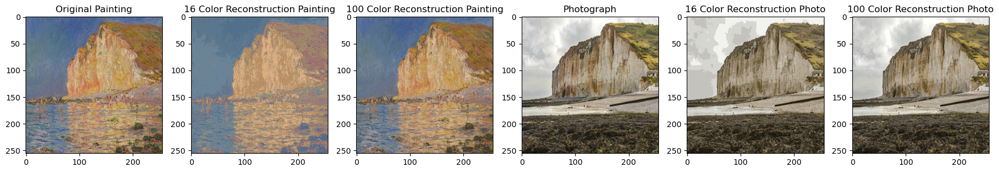

In [ ]:
f, axarr = plt.subplots(1,6, figsize=(18, 3))

# Let's compare the Petites Dalles photos and paintings 
X_petite_painting_16, CC_petite_painting_16, CC_init_petite_painting_16, whichCluster_petite_painting_16 = color_kmeans(painting_petite, K=16)
X_petite_photo_16, CC_petite_photo_16, CC_init_petite_photo_16, whichCluster_petite_photo_16 = color_kmeans(photo_petite, K=16)

axarr[0].imshow(painting_petite)
axarr[0].set_title('Original Painting')

Ir_petite_16 = np.reshape(CC_init_petite_painting_16[whichCluster_petite_painting_16,:], painting_petite.shape)
axarr[1].imshow(Ir_petite_16)
axarr[1].set_title('16 Color Reconstruction Painting')

axarr[2].imshow(Ir_petite_monet)
axarr[2].set_title('100 Color Reconstruction Painting')

axarr[3].imshow(photo_petite)
axarr[3].set_title('Photograph')

Ir_petite_photo_16 = np.reshape(CC_petite_photo_16[whichCluster_petite_photo_16,:], photo_petite.shape)
axarr[4].imshow(Ir_petite_photo_16)
axarr[4].set_title('16 Color Reconstruction Photo')

axarr[5].imshow(Ir_petite_photo)
axarr[5].set_title('100 Color Reconstruction Photo')

plt.tight_layout()
plt.show()

In [ ]:
# Check SSIM score of Paintings
_img1 = tensorify(painting_petite)
_img2 = tensorify(Ir_petite_16)
_img3 = tensorify(Ir_petite_monet)

_photo1 = tensorify(photo_petite)
_photo2 = tensorify(Ir_petite_photo_16)
_photo3 = tensorify(Ir_petite_photo)

true_vs_16 = ssim(_img1, _img2, val_range=255)
print("Painting vs 16 Color Reconstructioin SSIM Score:", true_vs_16)

true_vs_100 = ssim(_img1, _img3, val_range=255)
print("Painting vs 100 Color Reconstructioin SSIM Score:", true_vs_100)

print()

true_vs_16 = ssim(_photo1, _photo2, val_range=255)
print("Photo vs 16 Color Reconstructioin SSIM Score:", true_vs_16)

true_vs_100 = ssim(_photo1, _photo3, val_range=255)
print("Photo vs 100 Color Reconstructioin SSIM Score:", true_vs_100)

print()

painting_vs_photo = ssim(_img1, _photo1, val_range=255)
print("Original Painting vs Original Photo SSIM Score:", painting_vs_photo)


Painting vs 16 Color Reconstructioin SSIM Score: tensor(0.6928)
Painting vs 100 Color Reconstructioin SSIM Score: tensor(0.9397)

Photo vs 16 Color Reconstructioin SSIM Score: tensor(0.9132)
Photo vs 100 Color Reconstructioin SSIM Score: tensor(0.9823)

Original Painting vs Original Photo SSIM Score: tensor(0.2198)


**Understanding the SSIM results**  
As we increase the amount of colors we use to reconstruct the painting, we notice an increase in SSIM, since the images are using more and more of the same colors. The same happens for the photo. But, the photo reconstructions start off more similar (0.91) than the painting reconstructions (0.69). This may be because Monet uses a lot more shades of a similar color in this painting than the photo captures. Even just visually, the 16 color and the original photo look much more similar than the 16 color and the original painting. Using our modeling techniques, we hope to increase the SSIM score between the original painting and the original photo (0.2198). We will repeat this process for all of the matching paintings and location photos we've collected.

---

## Modeling

We intend to use this data of Monet's artwork to train a model that can apply Monet's style to a selection of images. 

### Model 1: CycleGAN
The Kaggle competition recommends we use this CycleGAN model to complete the task. A GAN is a generative adversarial network, which trains two neural networks to compete against one another. One network generates (Generator) new data by taking an input data sample and modifying it as much as possible. The other network (Discriminator) attempts to predict whether the generated data belongs to the original dataset or not. This system generates newer, improved versions of fake data until the predicting network can no longer distinguish between real and fake data.  

source: https://aws.amazon.com/what-is/gan/ 

In [ ]:
# imports
import tensorflow as tf
from tensorflow import keras
from keras import *
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import numpy as np
import random

# to clean up the notebook
# and to make these warnings issues for future us
import warnings 
warnings.filterwarnings('ignore')

First we must load in our dataset.

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
IMAGE_SIZE = [256, 256]

# functions to read in the data
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels = 3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {"image_name": tf.io.FixedLenFeature([], tf.string),
                       "image": tf.io.FixedLenFeature([], tf.string),
                       "target": tf.io.FixedLenFeature([], tf.string)}
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

# extract images from the files
def load_dataset(filenames, labeled = True, ordered = False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

In [ ]:
# get file names of the data
MONET_FILENAMES = tf.io.gfile.glob("data/monet_tfrec" + "/*.tfrec")
PHOTO_FILENAMES = tf.io.gfile.glob("data/photo_tfrec" + "/*.tfrec")

# load in the datasets
monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(1)

Now that we have properly loaded in the data, we must build our generator. We will use a U-Net architecture for our CycleGAN.  

Some information about U-Net: https://www.geeksforgeeks.org/u-net-architecture-explained/

In [ ]:
OUTPUT_CHANNELS = 3
from keras import layers

# reduces the 2D dimensions of the image by 
# the length of the step the filter takes
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    # strides = 2 reduces the weight and height by 2 -- applies the filter
    # to every other pixel
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

# increases the dimensions of the image
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

Our generator will first downsample the image and then upsample it. We will use long skip connections to help avoid the vanishing gradient problem, through concatenating the output of the downsample layer to the upsample layer symmetrically.

In [ ]:
# Generator Network
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

Next we will build the discriminator. It will take in the input image and classify it as real or generated. It will output a smaller 2D image with higher pixel values for a real classification and lower for a fake classification.

In [ ]:
# Discriminator Network
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

Now that we have our Generator and Discriminators defined. We will create instances of a Generator and Discriminator for each type of image.

In [ ]:
# set generators and discriminators for each type of image
monet_generator = Generator() # photo -> Monet
photo_generator = Generator() # Monet -> photo

monet_discriminator = Discriminator() # real Monet paintings vs generated Monet paintings
photo_discriminator = Discriminator() # real photos vs generated photos

Now we can build our model!

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)
            
            
        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
                   
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [ ]:
# compares real images to a matrix of 1s and fake to a matrix of 0s
# outputs the average of real and generated loss
def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

# compares generated image to a matrix of 1s to find loss
def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

# calculates cycle consistency loss by finding the average of the difference 
# between the original photo and the twice transformed photo
def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

# compares input with the output of the generator
def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss


Now we must train our model! We are selecting 25 epochs, as it is a proper balance between time efficiency and quality.

In [ ]:
monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

cycle_gan_model.compile(
    m_gen_optimizer = monet_generator_optimizer,
    p_gen_optimizer = photo_generator_optimizer,
    m_disc_optimizer = monet_discriminator_optimizer,
    p_disc_optimizer = photo_discriminator_optimizer,
    gen_loss_fn = generator_loss,
    disc_loss_fn = discriminator_loss,
    cycle_loss_fn = calc_cycle_loss,
    identity_loss_fn = identity_loss
)


# We will train on a subset of the dataset for efficiency
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds.take(5), photo_ds.take(5))),
    epochs=25
)

Epoch 1/25
5/5 [==============================] - 48s 4s/step - monet_gen_loss: 12.1905 - photo_gen_loss: 12.7745 - monet_disc_loss: 0.6889 - photo_disc_loss: 0.6896
Epoch 2/25
5/5 [==============================] - 18s 3s/step - monet_gen_loss: 12.0593 - photo_gen_loss: 12.6254 - monet_disc_loss: 0.6737 - photo_disc_loss: 0.6758
Epoch 3/25
5/5 [==============================] - 18s 4s/step - monet_gen_loss: 11.7679 - photo_gen_loss: 12.3103 - monet_disc_loss: 0.6585 - photo_disc_loss: 0.6611
Epoch 4/25
5/5 [==============================] - 19s 4s/step - monet_gen_loss: 11.2259 - photo_gen_loss: 11.7209 - monet_disc_loss: 0.6468 - photo_disc_loss: 0.6516
Epoch 5/25
5/5 [==============================] - 20s 4s/step - monet_gen_loss: 10.2624 - photo_gen_loss: 10.6895 - monet_disc_loss: 0.6353 - photo_disc_loss: 0.6464
Epoch 6/25
5/5 [==============================] - 19s 4s/step - monet_gen_loss: 8.7116 - photo_gen_loss: 9.0353 - monet_disc_loss: 0.6299 - photo_disc_loss: 0.6640
Epoch 

Now we can visualize our Monet-ized photos!!

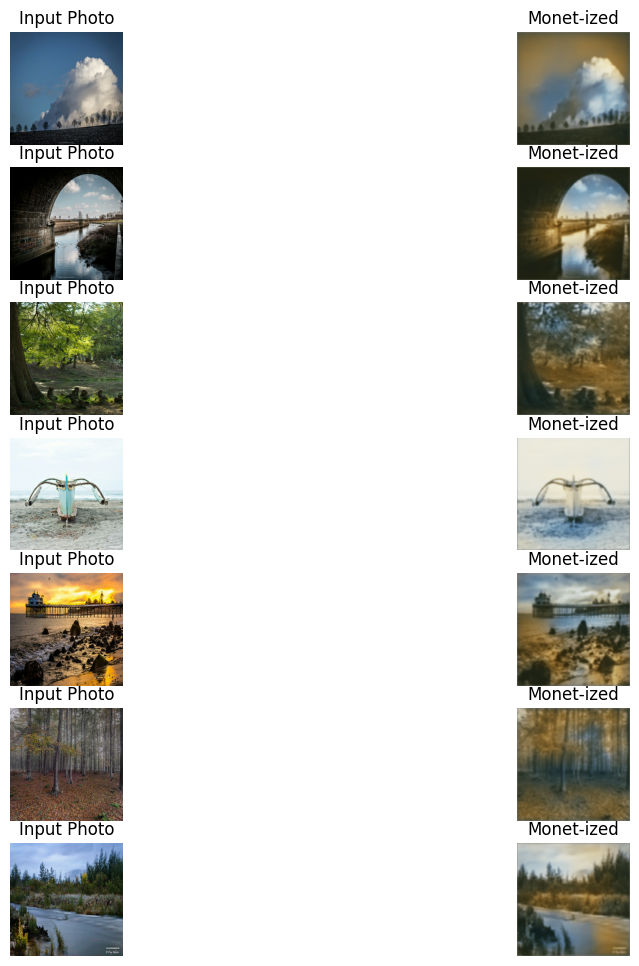

In [ ]:
_, ax = plt.subplots(7, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(7)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-ized")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
    
plt.show()

### Model 2: Pretrained VGG19

Next, we will use a model that only takes in one style image (i.e. a Monet painting) and one content image, in order to transform the content image to be in the style of the Monet painting.  

This method optimizes the output image to match the content statistics of the content image and the style statistics of the style reference image. We will extract these statistics through the use of the VGG19 Convolutional Neural Network.  

Reference: https://www.tensorflow.org/tutorials/generative/style_transfer#:~:text=Neural%20style%20transfer%20is%20an,of%20the%20style%20reference%20image.

In [4]:
# imports
import os
import tensorflow as tf
import IPython.display as display

import numpy as np
import PIL.Image
import time
import functools

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False


os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [2]:
# functions for image retrieval and showing
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

We can create a VGG model as follows that returns a list of intermediate output values.

In [ ]:
def vgg_layers(layer_names):
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [ ]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

Now we will use TensorFlow Keras to create a feature extractor that we can use in this style transfer.

In [ ]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [ ]:
def style_content_loss(outputs, style_targets, style_weight, num_style_layers, content_targets, content_weight, num_content_layers):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

total_variation_weight=30

# train step for each iteration
def train_step(image,extractor, opt, style_targets, style_weight, num_style_layers, content_targets, content_weight, num_content_layers):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs, style_targets, style_weight, num_style_layers, content_targets, content_weight, num_content_layers)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

To easily "monet-ize" these images, we will craft a monetize function below that will load the images, preprocess the images, load in VGG19 and define its style and content layers. Then it will create a style extractor, extract style and content targets, optimize the model to minimize loss, and then display the results.

In [ ]:
'''
Pass in the jpg image path for content and style images
'''
def monetize(content_path, style_path):
    content_image = load_img(content_path)
    style_image = load_img(style_path)
    x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
    x = tf.image.resize(x, (224, 224))
    vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
    prediction_probabilities = vgg(x)
    prediction_probabilities.shape
    
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

    content_layers = ['block5_conv2'] 

    style_layers = ['block1_conv1',
                    'block2_conv1',
                    'block3_conv1', 
                    'block4_conv1', 
                    'block5_conv1']

    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    style_extractor = vgg_layers(style_layers)
    style_outputs = style_extractor(style_image*255)

    extractor = StyleContentModel(style_layers, content_layers)

    results = extractor(tf.constant(content_image))
    
    # Gradient descent
    style_targets = extractor(style_image)['style']
    content_targets = extractor(content_image)['content']

    image = tf.Variable(content_image)
    
    opt = tf.keras.optimizers.legacy.Adam(learning_rate=0.001, beta_1=0.99, epsilon=1e-1)

    style_weight=1e-2
    content_weight=1e4

    start = time.time()

    epochs = 10
    steps_per_epoch = 10

    step = 0
    for n in range(epochs):
        for m in range(steps_per_epoch):
            step += 1
            train_step(image, extractor, opt, style_targets, style_weight, num_style_layers, content_targets, content_weight, num_content_layers)
            print(".", end='', flush=True)
        display.clear_output(wait=True)
        display.display(tensor_to_image(image))
        print("Train step: {}".format(step))

    end = time.time()
    print("Total time: {:.1f}".format(end-start))

    plt.subplot(1, 3, 1)
    imshow(content_image, 'Original Photo')

    plt.subplot(1, 3, 2)
    imshow(image, 'Monet-ized Image')

    plt.subplot(1, 3, 3)
    imshow(style_image, 'Monet Painting')

The following are the monetization results of locations that inspired some of Monet's paintings.

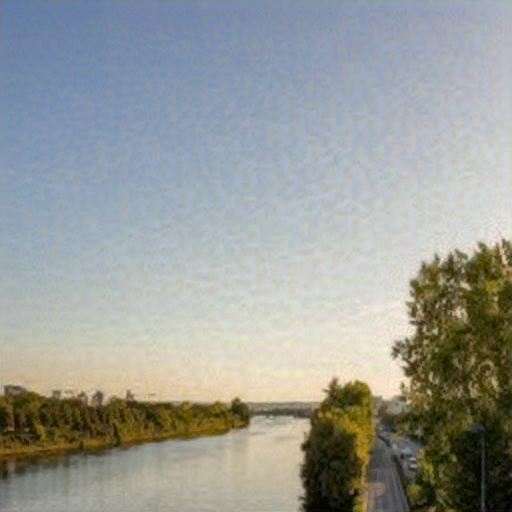

Train step: 100
Total time: 513.4


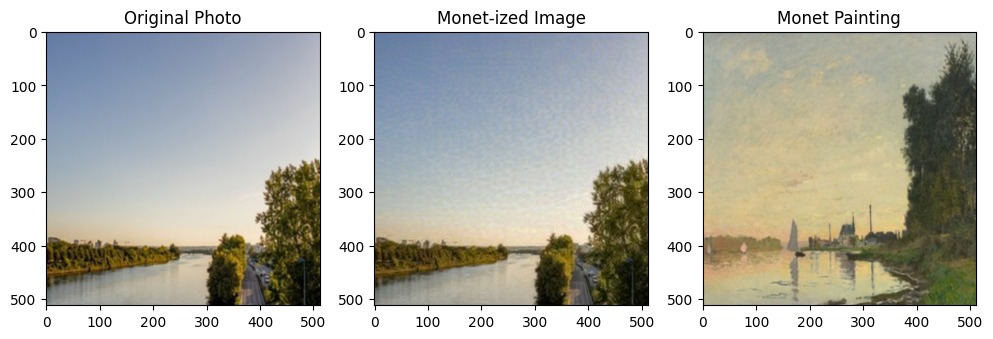

In [ ]:
# Argenteuil
argentuil_content_path = 'data/monet_ref_loc.jpg/Argenteuil.jpg'
argentuil_style_path = 'data/monet_loc.jpg/Argenteuil.jpg'

monetize(argentuil_content_path, argentuil_style_path)

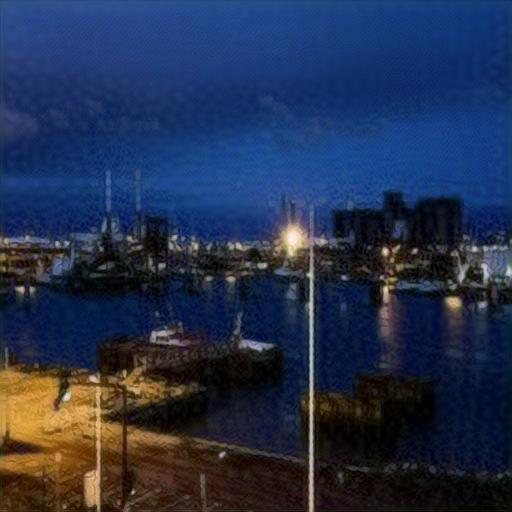

Train step: 100
Total time: 551.3


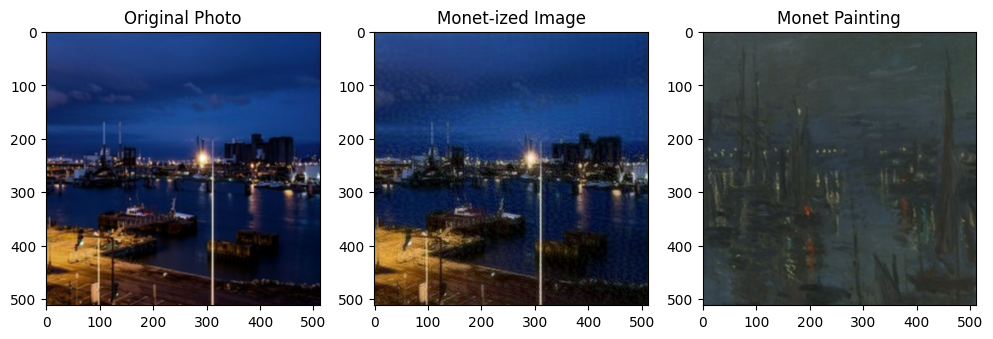

In [ ]:
# La Havre
havre_content_path = 'data/monet_ref_loc.jpg/LaHavre.jpg'
havre_style_path = 'data/monet_loc.jpg/LaHavre.jpg'

monetize(havre_content_path, havre_style_path)

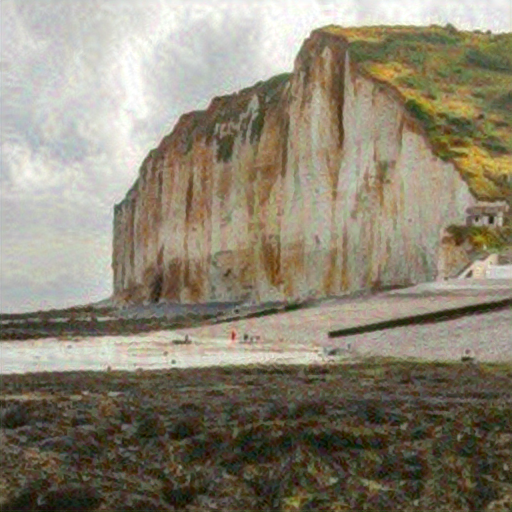

Train step: 100
Total time: 559.2


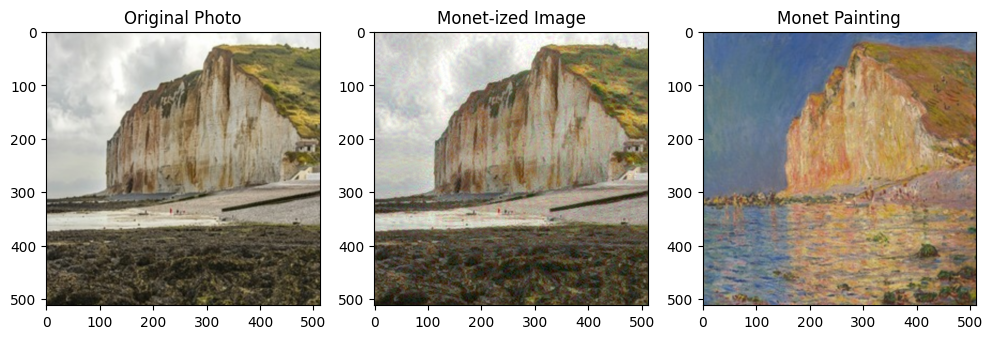

In [ ]:
# Petite-Dalles
dalles_content_path = 'data/monet_ref_loc.jpg/Petites-Dalles.jpg'
dalles_style_path = 'data/monet_loc.jpg/Petites-Dalles.jpg'

monetize(dalles_content_path, dalles_style_path)

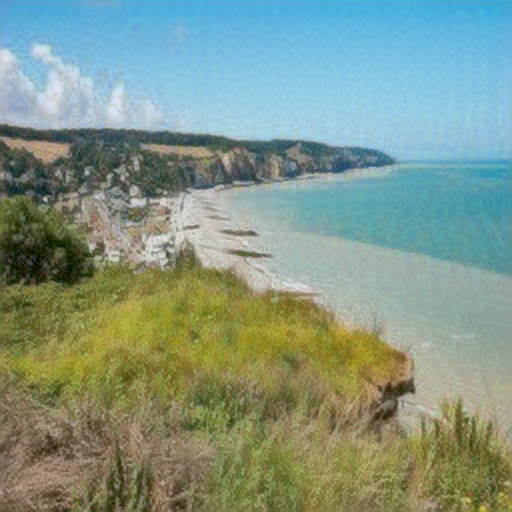

Train step: 100
Total time: 584.5


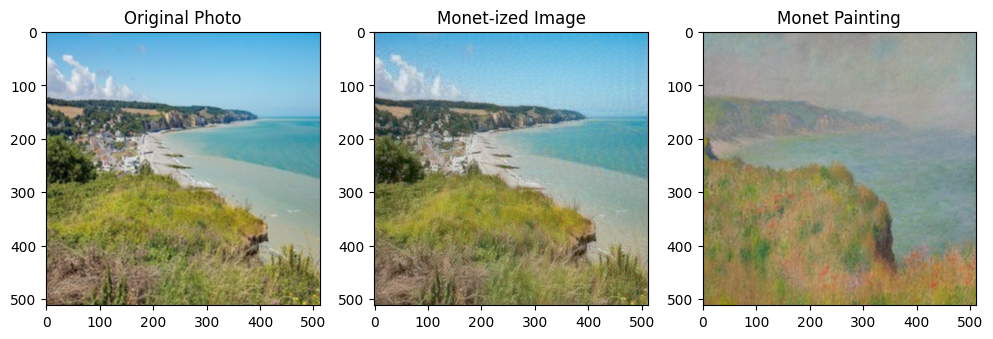

In [ ]:
# Pourville
pourville_content_path = 'data/monet_ref_loc.jpg/Pourville.jpg'
pourville_style_path = 'data/monet_loc.jpg/Pourville.jpg'

monetize(pourville_content_path, pourville_style_path)

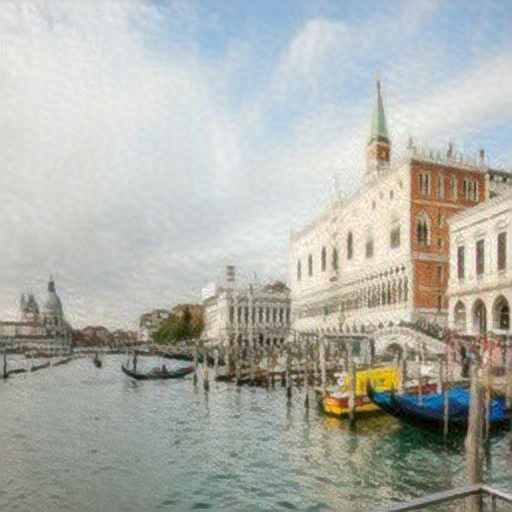

Train step: 100
Total time: 542.9


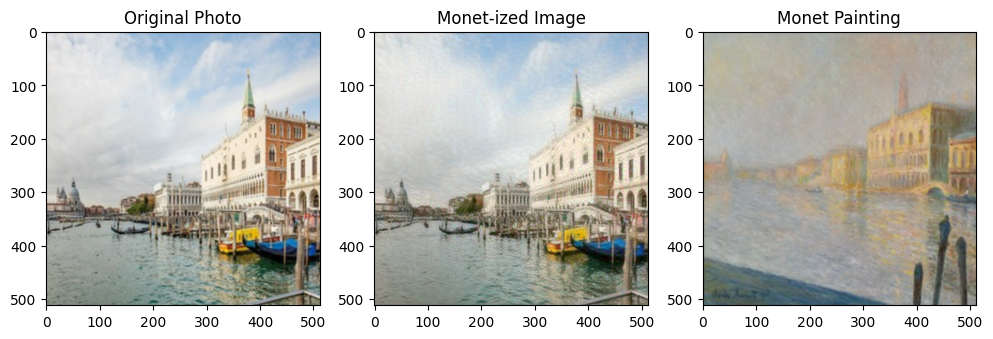

In [ ]:
# Venice
venice_content_path = 'data/monet_ref_loc.jpg/Venice.jpg'
venice_style_path = 'data/monet_loc.jpg/Venice.jpg'

monetize(venice_content_path, venice_style_path)

In [ ]:
# Bordighera
bordighera_content_path = 'data/bordighera/photo-bordighera.jpg'
bordinghera_style_path = 'data/bordighera/painting-bordighera.jpg'

monetize(bordighera_content_path, bordinghera_style_path)

In [ ]:
# Etretat
etretat_content_path = 'data/etretat/photo-etretat.jpg'
etretat_style_path = 'data/etretat/painting-etretat.jpg'

monetize(etretat_content_path, etretat_style_path)

With this model, rerunning and retraining on the same image sometimes yields varying results. As seen below, with one run on the image of Petites-Dalles, we have a much more brushstroke-y output, but the previous run yields an image with much more subtle brushtrokes and that resembles the original image much more. Unfortunately on all of the runs in this Final_report file, they are the less vibrant images.

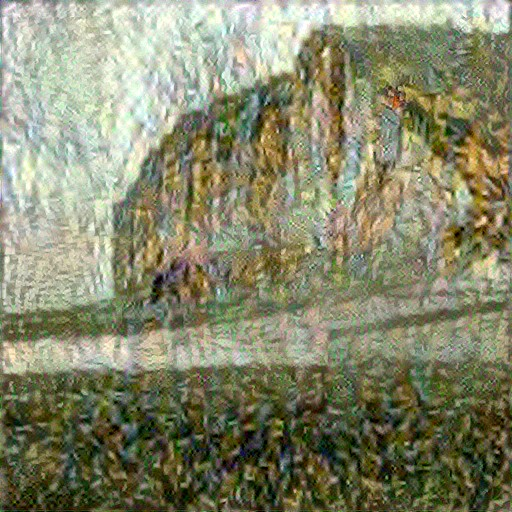

In [7]:
image_brushstrokey = "data/monetized_loc/Petite-Dalles.jpeg"
display.display(tensor_to_image(load_img(image_brushstrokey)))


For both models, we used the default hyperparameters and those provided in an example by Kaggle as we have very little experience working with these types of neural networks and we were satisfied with the results. We only changed the learning rate of the second model, to cut the time down to 10 minutes per image.

Given the above models, we believe Model 2 (our VGG19 model), works the best for our project. This model more effectively captures the brushstrokes compared to the first model, despite being trained on fewer images. It also allows us to capture the individualistic qualities of each Monet painting in comparison to their respective location, rather than training on all of his paintings.

---

## Performance Results

### MiFID - Model 1
As recommended by Kaggle, we will use MiFID (Memorization-informed Fréchet Inception Distance), which is a modification from Fréchet Inception Distance (FID) to evalutes how good Model 1 is. The smaller the MiFID is, the better the generated images are. 

First, we will use the methods written in the article below to generate the model and the methods we need to compare our photo datasets with. 

https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/

In [1]:
# example of calculating the frechet inception distance in Keras
import numpy
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize
 
# scale an array of images to a new size
def scale_images(images, new_shape):
    images_list = list()
    for image in images:
        # resize with nearest neighbor interpolation
        new_image = resize(image, new_shape, 0)
        # store
        images_list.append(new_image)
    return asarray(images_list)
 
# calculate frechet inception distance
def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)
    # calculate mean and covariance statistics
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
    # calculate sum squared difference between means
    ssdiff = numpy.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid
 
# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))

# # define two fake collections of images
# images1 = randint(0, 255, 10*32*32*3)
# images1 = images1.reshape((10,32,32,3))
# images2 = randint(0, 255, 10*32*32*3)
# images2 = images2.reshape((10,32,32,3))
# print('Prepared', images1.shape, images2.shape)

# # convert integer to floating point values
# images1 = images1.astype('float32')
# images2 = images2.astype('float32')

# # resize images
# images1 = scale_images(images1, (299,299,3))
# images2 = scale_images(images2, (299,299,3))
# print('Scaled', images1.shape, images2.shape)

# # pre-process images
# images1 = preprocess_input(images1)
# images2 = preprocess_input(images2)

# # fid between images1 and images1
# fid = calculate_fid(model, images1, images1)
# print('FID (same): %.3f' % fid)
# # fid between images1 and images2
# fid = calculate_fid(model, images1, images2)
# print('FID (different): %.3f' % fid)

2024-04-30 17:59:30.843259: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
import os
from PIL import Image

# Function to load images from a folder
def load_images_from_folder(folder_path, size):
    images = []
    for filename in os.listdir(folder_path):
        filepath = os.path.join(folder_path, filename)
        try:
            # Load image
            image = Image.open(filepath)
            # Resize image
            image = image.resize(size)
            # Convert to numpy array
            image = asarray(image)
            # Store image and file path
            images.append((image, filepath))
        except:
            # Skip if unable to load or process the image
            continue
    return images

# Define folder paths for two datasets
folder_path1 = "data/photo_jpg/"
folder_path2 = "data/monet_jpg/"

# Load images from folders
images1 = load_images_from_folder(folder_path1, (299, 299))
images2 = load_images_from_folder(folder_path2, (299, 299))
print('Loaded', len(images1), 'images from folder 1')
print('Loaded', len(images2), 'images from folder 2')

# Extract images and file paths
images1, file_paths1 = zip(*images1)
images2, file_paths2 = zip(*images2)

# Convert images to numpy arrays
images1 = asarray(images1)
images2 = asarray(images2)

# Convert integer to floating point values
images1 = images1.astype('float32')
images2 = images2.astype('float32')

# Pre-process images
images1 = preprocess_input(images1)
images2 = preprocess_input(images2)

# FID between images1 and images1
fid = calculate_fid(model, images1, images1)
print('FID (same): %.3f' % fid)
# FID between images1 and images2
fid = calculate_fid(model, images1, images2)
print('FID (different): %.3f' % fid)


Loaded 7038 images from folder 1
Loaded 299 images from folder 2
220/220 [==============================] - 529s 2s/step
FID (same): -0.000
10/10 [==============================] - 23s 2s/step
FID (different): 5601848934919836737238225643125789942891538082581324689249386235724548574349175942004342784.000


In [2]:
import os
from PIL import Image

# Function to load images from a folder
def load_images_from_folder(folder_path, size):
    images = []
    for filename in os.listdir(folder_path):
        filepath = os.path.join(folder_path, filename)
        try:
            # Load image
            image = Image.open(filepath)
            # Resize image
            image = image.resize(size)
            # Convert to numpy array
            image = asarray(image)
            # Store image and file path
            images.append((image, filepath))
        except:
            # Skip if unable to load or process the image
            continue
    return images

# Define folder paths for two datasets
folder_path1 = "data/model1_generated/"
folder_path2 = "data/monet_jpg/"

# Load images from folders
images1 = load_images_from_folder(folder_path1, (299, 299))
images2 = load_images_from_folder(folder_path2, (299, 299))
print('Loaded', len(images1), 'images from folder 1')
print('Loaded', len(images2), 'images from folder 2')

# Extract images and file paths
images1, file_paths1 = zip(*images1)
images2, file_paths2 = zip(*images2)

# Convert images to numpy arrays
images1 = asarray(images1)
images2 = asarray(images2)

# Convert integer to floating point values
images1 = images1.astype('float32')
images2 = images2.astype('float32')

# Pre-process images
images1 = preprocess_input(images1)
images2 = preprocess_input(images2)

# FID between images1 and images1
fid = calculate_fid(model, images1, images1)
print('FID (same): %.3f' % fid)
# FID between images1 and images2
fid = calculate_fid(model, images1, images2)
print('FID (different): %.3f' % fid)

Loaded 7038 images from folder 1
Loaded 299 images from folder 2
220/220 [==============================] - 521s 2s/step
FID (same): -0.000
10/10 [==============================] - 22s 2s/step
FID (different): 36666647574020749552832022391368806898926431085986852511450528088378863395740060711301152768.000


In [7]:
if 36666647574020749552832022391368806898926431085986852511450528088378863395740060711301152768 < 5601848934919836737238225643125789942891538082581324689249386235724548574349175942004342784:
    print("True")
else:
    print("False")

False


**Interpreting MiFID**  
We thought that by putting the dataset of newly generated images into the MiFID calculator, we would get a lower score than when we put the original images into the calculator. But, this was not the case. With further improvements to our model, we may have been able to generate a lower number or with more changes to how we calculate the MiFID number. A higher MiFID number implies that our model made the images less similar to the Monet images. 


### SSIM - Model 2  
To evaluate Model 2, we decided to use SSIM, which can compare how similar two images are to each other. We will compare the original Monet, to the photo of the landscape, to the Monet-ized version of the painting.

In [30]:
# Function to resize images in a folder
def resize_images(folder_path, output_folder, size=(256, 256)):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Loop through all files in the folder
    for filename in os.listdir(folder_path):
        # Check if the file is an image
        if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
            # Open the image
            img = Image.open(os.path.join(folder_path, filename))
            
            # Resize the image
            resized_img = img.resize(size)
            
            # Save the resized image to the output folder
            resized_img.save(os.path.join(output_folder, filename))

# Example usage
input_folder = "data/copy_monetized/"
output_folder = "data/output_copied"
resize_images(input_folder, output_folder)

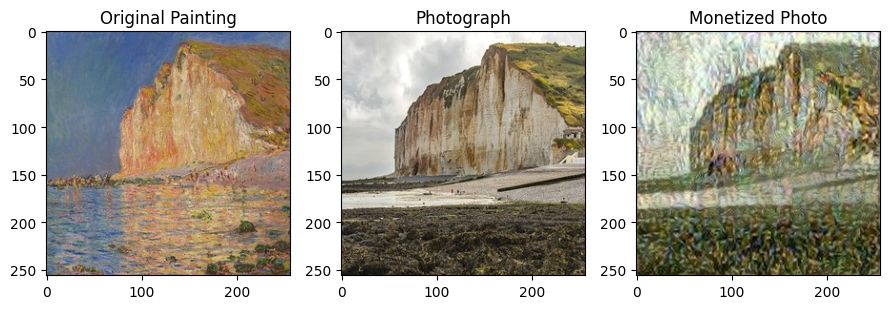

In [31]:
# Show the images we will compare
# Petites Dalles
f, axarr = plt.subplots(1,3, figsize=(9, 3))

axarr[0].imshow(painting_dal)
axarr[0].set_title('Original Painting')

axarr[1].imshow(loc_dal)
axarr[1].set_title('Photograph')

# Open the image file
monetized_dal = plt.imread('data/output_copied/Petite-Dalles.jpeg')

# Resize the image to 256x256 pixels
# monetized_dal = monetized_dal.resize((256, 256))
axarr[2].imshow(monetized_dal)
axarr[2].set_title('Monetized Photo')

plt.tight_layout()
plt.show()

In [35]:
# Check SSIM score of Paintings
painting = tensorify(painting_dal) 
photo = tensorify(loc_dal) 
monetized = tensorify(monetized_dal)

painting_vs_photo = ssim(painting, photo, val_range=255)
print("Painting vs Photo SSIM Score:", painting_vs_photo)

painting_vs_monetized = ssim(painting, monetized, val_range=255)
print("Painting vs Monetized SSIM Score:", painting_vs_monetized)

photo_vs_monetized = ssim(photo, monetized, val_range = 255)
print("Photo vs Monetized SSIM Score:", photo_vs_monetized)


Painting vs Photo SSIM Score: tensor(0.2229)
Painting vs Monetized SSIM Score: tensor(0.1401)
Photo vs Monetized SSIM Score: tensor(0.5035)


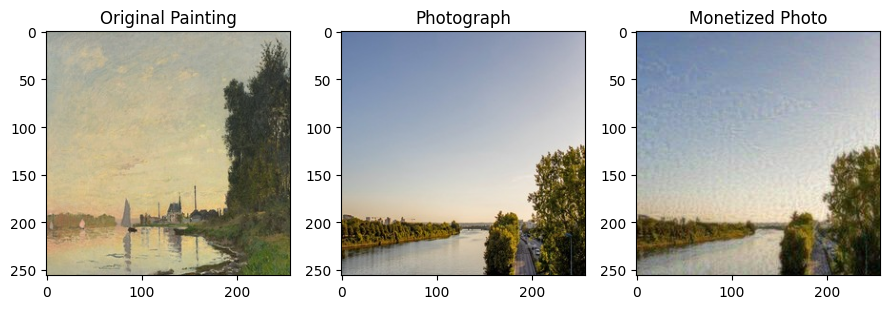

In [33]:
# Show the images we will compare
# Argenteuil
f, axarr = plt.subplots(1,3, figsize=(9, 3))

axarr[0].imshow(painting_arg)
axarr[0].set_title('Original Painting')

axarr[1].imshow(loc_arg)
axarr[1].set_title('Photograph')

# Open the image file
monetized_arg = plt.imread('data/output_copied/Argenteuil.jpeg')
axarr[2].imshow(monetized_arg)
axarr[2].set_title('Monetized Photo')

plt.tight_layout()
plt.show()

In [36]:
# Check SSIM score of Paintings
painting = tensorify(painting_arg) 
photo = tensorify(loc_arg) 
monetized = tensorify(monetized_arg)

painting_vs_photo = ssim(painting, photo, val_range=255)
print("Painting vs Photo SSIM Score:", painting_vs_photo)

painting_vs_monetized = ssim(painting, monetized, val_range=255)
print("Painting vs Monetized SSIM Score:", painting_vs_monetized)

photo_vs_monetized = ssim(photo, monetized, val_range = 255)
print("Photo vs Monetized SSIM Score:", photo_vs_monetized)


Painting vs Photo SSIM Score: tensor(0.5306)
Painting vs Monetized SSIM Score: tensor(0.4867)
Photo vs Monetized SSIM Score: tensor(0.8360)


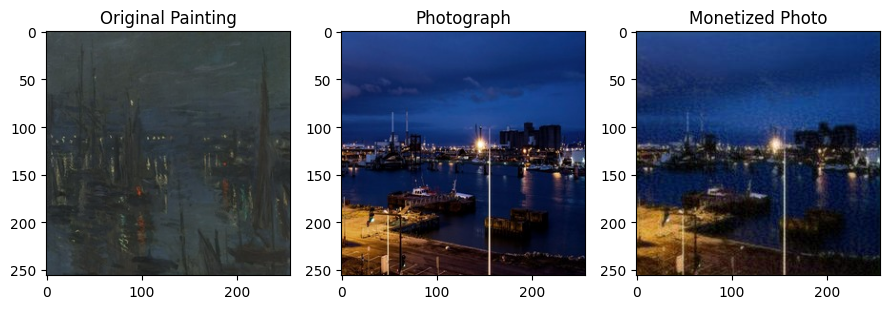

In [39]:
# Show the images we will compare
# LaHavre
f, axarr = plt.subplots(1,3, figsize=(9, 3))

axarr[0].imshow(painting_lah)
axarr[0].set_title('Original Painting')

axarr[1].imshow(loc_lah)
axarr[1].set_title('Photograph')

monetized_lah = plt.imread('data/output_copied/LaHavre.jpeg')
axarr[2].imshow(monetized_lah)
axarr[2].set_title('Monetized Photo')

plt.tight_layout()
plt.show()

In [40]:
# Check SSIM score of Paintings
painting = tensorify(painting_lah) 
photo = tensorify(loc_lah) 
monetized = tensorify(monetized_lah)

painting_vs_photo = ssim(painting, photo, val_range=255)
print("Painting vs Photo SSIM Score:", painting_vs_photo)

painting_vs_monetized = ssim(painting, monetized, val_range=255)
print("Painting vs Monetized SSIM Score:", painting_vs_monetized)

photo_vs_monetized = ssim(photo, monetized, val_range = 255)
print("Photo vs Monetized SSIM Score:", photo_vs_monetized)


Painting vs Photo SSIM Score: tensor(0.4040)
Painting vs Monetized SSIM Score: tensor(0.4035)
Photo vs Monetized SSIM Score: tensor(0.8149)


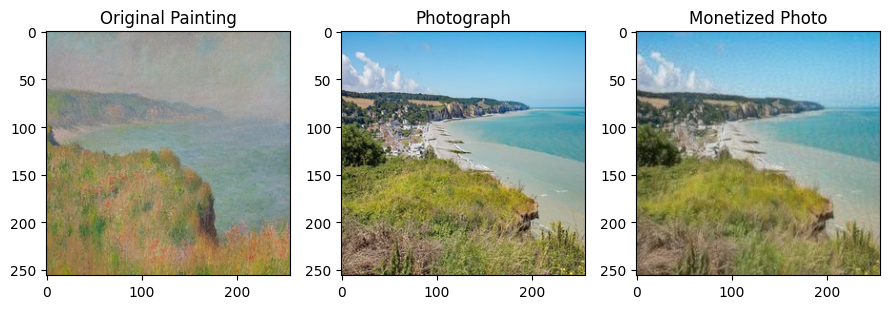

In [42]:
# Show the images we will compare
# Pourville
f, axarr = plt.subplots(1,3, figsize=(9, 3))

axarr[0].imshow(painting_pou)
axarr[0].set_title('Original Painting')

axarr[1].imshow(loc_pou)
axarr[1].set_title('Photograph')

monetized_pou = plt.imread('data/output_copied/Pourville.jpeg')
axarr[2].imshow(monetized_pou)
axarr[2].set_title('Monetized Photo')

plt.tight_layout()
plt.show()

In [43]:
# Check SSIM score of Paintings
painting = tensorify(painting_pou) 
photo = tensorify(loc_pou) 
monetized = tensorify(monetized_pou)

painting_vs_photo = ssim(painting, photo, val_range=255)
print("Painting vs Photo SSIM Score:", painting_vs_photo)

painting_vs_monetized = ssim(painting, monetized, val_range=255)
print("Painting vs Monetized SSIM Score:", painting_vs_monetized)

photo_vs_monetized = ssim(photo, monetized, val_range = 255)
print("Photo vs Monetized SSIM Score:", photo_vs_monetized)


Painting vs Photo SSIM Score: tensor(0.3892)
Painting vs Monetized SSIM Score: tensor(0.4282)
Photo vs Monetized SSIM Score: tensor(0.7833)


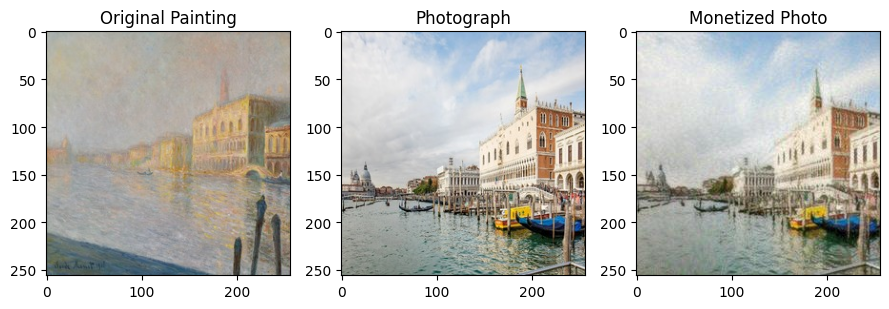

In [44]:
# Show the images we will compare
# Venice
f, axarr = plt.subplots(1,3, figsize=(9, 3))

axarr[0].imshow(painting_ven)
axarr[0].set_title('Original Painting')

axarr[1].imshow(loc_ven)
axarr[1].set_title('Photograph')

monetized_ven = plt.imread('data/output_copied/Venice.jpeg')
axarr[2].imshow(monetized_ven)
axarr[2].set_title('Monetized Photo')

plt.tight_layout()
plt.show()

In [45]:
# Check SSIM score of Paintings
painting = tensorify(painting_ven) 
photo = tensorify(loc_ven) 
monetized = tensorify(monetized_ven)

painting_vs_photo = ssim(painting, photo, val_range=255)
print("Painting vs Photo SSIM Score:", painting_vs_photo)

painting_vs_monetized = ssim(painting, monetized, val_range=255)
print("Painting vs Monetized SSIM Score:", painting_vs_monetized)

photo_vs_monetized = ssim(photo, monetized, val_range = 255)
print("Photo vs Monetized SSIM Score:", photo_vs_monetized)


Painting vs Photo SSIM Score: tensor(0.4239)
Painting vs Monetized SSIM Score: tensor(0.4385)
Photo vs Monetized SSIM Score: tensor(0.8194)


**Understanding SSIM**  
Unfortunately, only 2/5 of the monetized photos we generated were more similar than comparing the original painting to the original photo. With better training of our models, we're sure that we could have gotten higher values. If we had more photos of the locations of the photos, that would have been helpful as well and we might have been able to estabilish a bit more of a pattern.

---

## Discussion  



While our results could have been improved if we had spent more time tuning hyperparameters, we felt as though we learned a lot about image processing and what makes an image unique. We spent much of our time researching style transfer and the different metrics to quantify our results that we did not have ample time to truly produce the best images. We found it interesting that the model trained on more images had worse (qualitatively speaking) results than the model trained on one image.

### Challenges with EDA  
Unfortunately, there doesn't seem to be a lot of literature/articles out there that suggest classic EDA to do with images. Luckily, Professor Stough had a lot of insight and we were able to use some of the notebooks he had already written. We still would have liked to find more ways to compare images, beyond just RGB values, as to account for Monet's distinct impressionist style, with the evident brush strokes. 

### Challenges with Modeling
Many models for style transfer are quite complex, making them difficult to fully understand. Once we could fully understand them, it was then more difficult to properly tune the hyperparameters, while testing, as each iteration of testing would take long amounts of time. It is also difficult to measure the quality of the model, as there are very few metrics for image similarity, so oftentimes we have to simply judge with our eyes. 

--- 

## Conclusions

Although our models did not appear to improve image similarity to a Monet painting, we felt as though we gained knowledge on how to get information from an image and use image data in a Neural Network. We were also able to compare two models: a GAN and a pretrained VGG19. In doing this we learned that the VGG19 is great for our single image input scenarios, but the GAN is great for processing all of Monet's images and transforming thousands of images at once.  
Despite much of our class dealing with numerical data, we found it interesting to see a more visual form of data, and how to turn it into numbers for a computer to use and process.  

### Future Considerations

If we had more time, we would have liked to better understand the SSIM and MiDIF metrics for comparing image datasets. With better metrics, we might have been able to understand our images a bit better. We also would hope to use our models on different painters' artworks, to see if we could complete the same project but on works from Picasso or Van Gogh.    

